In [29]:
# To import functions from Phase_1.py
import sys
from pathlib import Path
sys.path.append(str(Path().resolve().parent))

In [30]:
# Load the model-class and model-loader
from Phase_1 import Phase1Pipeline, load_model_from_path

**Phase-2 description (from email)**

Goal is to build a classification model from the labeled stages from Phase-1.\

We will use the following classification algos:
- Log-reg
- SVM
- Random forest
- etc

The model shall predict stages from 0-4 (same as stages defined in the data)

Tips:
- Use `class_weight="balanced"` or provide custom class weights for imbalance b/w stages.
- Evaluate model(s) using the standard classification metrics - F1, precision, recall, accuracy.
    - Focus on the accuracy of preds on **Stages 3 and 4**
- Use a conf-mat to check where the model is good/bad

Ways to improve misclassification:
- Check feature importance (feature selection and/or model explainability)
- Try advanced models like XGBoost
- Add rolling stats (like: mean, std-dev over time, etc) as new features
- Balance the dataset (SMOTE, essentially adds artificial points around real points)



**My notes on Phase-2**\
This is more or less a plan of action for this Phase (similar to the Phase-1).

1. Split the data into train-test early (to prevent data-leakage of any sort)
2. Perform some data analysis, look for outliers (they do exist, we saw them in Phase-1)
    - try to replace the values or remove them entirely
    - **replace is prefered**
3. Perform some more EDA to further understand the dataset before performing classification
4. Add the rolling statistics as new features
5. Check for class imbalance (usually a 20% ish imbalance is fine, if its more then use SMOTE)
6. Create a few new dataframes/datasets with various pre-processing (normalize and standardize)

**Plan**

1. Data prep and splitting
    - [x] Split early (train-test split by `Engine no` preferred to avoid leakage acrocc sequences)
    - [ ] Save test engine IDs to reuse consistenly across experiments
2. Outlier handling
    - [x] Detect outliers using z-score, IQR, or visual methods (boxplots per sensor)
    - [x] Replace with rolling median/mean/std-dev insead of droping
    - [x] Optionally log outlier rate per sensor
3. Exploratory data analysis
    - [x] Check class distribution (Stage 0-4)
    - [x] Visualize sensor value distributions by stage
    - [x] Visualize pairplots or PCA by stage label
    - [x] Correlation-matrix (heatmap) with label to find informative sensors
4. Feature engineering
    - [ ] Add rolling mean,std, min, max over a window (5ish cycles) as a new feature
    - [ ] Add deltas: difference b/w current and preious cycle
    - [ ] Time sinze last stage change (temporal affinities)
    - [ ] Drop highly correlated or low variance features
5. Preprocessing varaints
    - [ ] Try multiple version: raw, min-max, z-score
    - [ ] Save these versions as labeled datasets (`df_std`, `df_norm`, etc)
6. Modeling
    - [x] Logistic regression (w/ `class_weights = "balanced"`)
    - [x] SVM (linear, RBF)
    - [x] Random forest
    - [x] XGBoost (handle imbalance with `scale_pos_weight`)
    - [ ] Try pipelines with `StandardScaler` and `MinMaxScaler`
7. Evaluation
    - [x] Confusion matrix (stages 3 and 4)
    - [ ] Per-class precision, recall, F1
    - [x] Overall accuracy
    - [x] Stage 3+4 vs others (binary reformulation)
8. Class imbalance
    - [x] Apple SMOTE on train-set
    - [ ] Try using class weights (alternative to SMOTE)
    - [x] Track performance with and without balancing
9. Feature importance and explainability
    - [x] Use `feature_importances_` from random forest (or) XGBoost
    - [x] Try `SHAP` or `PermutationImportance`
    - [ ] Drop irrelevant features and retrain
10. Model selection
    - [x] Just compare them on accracy and validation metrics
    - [x] Save model and create load function (+ class abstraction)

# Data prep and splitting
1. Split early (train-test split by `Engine no` preferred to avoid leakage acrocc sequences)
2. Save test engine IDs to reuse consistenly across experiments

In [31]:
# Load data
import os
import pandas as pd
curr_dir = Path(os.getcwd())
data_dir = curr_dir.parent / "Phase_1" / "train_FD001_phase_1.csv"
df = pd.read_csv(data_dir)
df.head()

,Engine no,Num cycles,Operating 1,Operating 2,Operating 3,Sensor 1,Sensor 2,Sensor 3,Sensor 4,Sensor 5,...,Sensor 13,Sensor 14,Sensor 15,Sensor 16,Sensor 17,Sensor 18,Sensor 19,Sensor 20,Sensor 21,Stage
0,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,...,2388.07,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236,0
1,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,...,2388.03,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442,0
2,1,4,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,...,2388.08,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739,0
3,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,...,2388.04,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044,0
4,1,6,-0.0043,-0.0001,100.0,518.67,642.10,1584.47,1398.37,14.62,...,2388.03,8132.85,8.4108,0.03,391,2388,100.0,38.98,23.3669,0


In [32]:
df["Stage"].value_counts()

Stage
2    5514
1    5393
0    4700
3    2951
4    2072
Name: count, dtype: int64

In [67]:
train_df = df

In [68]:
# Basic understanding of train-set
train_df.describe()

,Engine no,Num cycles,Operating 1,Operating 2,Operating 3,Sensor 1,Sensor 2,Sensor 3,Sensor 4,Sensor 5,...,Sensor 13,Sensor 14,Sensor 15,Sensor 16,Sensor 17,Sensor 18,Sensor 19,Sensor 20,Sensor 21,Stage
count,20630.000000,20630.000000,20630.000000,20630.000000,20630.0,2.063000e+04,20630.000000,20630.000000,20630.000000,2.063000e+04,...,20630.000000,20630.000000,20630.000000,2.063000e+04,20630.000000,20630.0,20630.0,20630.000000,20630.000000,20630.000000
mean,51.509016,108.813088,-0.000009,0.000002,100.0,5.186700e+02,642.680975,1590.523159,1408.934186,1.462000e+01,...,2388.096156,8143.752971,8.442147,3.000000e-02,393.210713,2388.0,100.0,38.816259,23.289699,1.626854
std,29.226226,68.878570,0.002187,0.000293,0.0,6.537152e-11,0.500029,6.131295,9.000636,3.394700e-12,...,0.071919,19.076605,0.037506,1.556432e-14,1.548778,0.0,0.0,0.180743,0.108250,1.256319
min,1.000000,1.000000,-0.008700,-0.000600,100.0,5.186700e+02,641.210000,1571.040000,1382.250000,1.462000e+01,...,2387.880000,8099.940000,8.324900,3.000000e-02,388.000000,2388.0,100.0,38.140000,22.894200,0.000000
25%,26.000000,52.000000,-0.001500,-0.000200,100.0,5.186700e+02,642.330000,1586.260000,1402.360000,1.462000e+01,...,2388.040000,8133.242500,8.414900,3.000000e-02,392.000000,2388.0,100.0,38.700000,23.221800,1.000000
50%,52.000000,104.000000,-0.000000,0.000000,100.0,5.186700e+02,642.640000,1590.100000,1408.040000,1.462000e+01,...,2388.090000,8140.540000,8.438950,3.000000e-02,393.000000,2388.0,100.0,38.830000,23.297900,2.000000
75%,77.000000,156.000000,0.001500,0.000300,100.0,5.186700e+02,643.000000,1594.380000,1414.557500,1.462000e+01,...,2388.140000,8148.310000,8.465600,3.000000e-02,394.000000,2388.0,100.0,38.950000,23.366800,2.000000
max,100.000000,362.000000,0.008700,0.000600,100.0,5.186700e+02,644.530000,1616.910000,1441.490000,1.462000e+01,...,2388.560000,8293.720000,8.584800,3.000000e-02,400.000000,2388.0,100.0,39.430000,23.618400,4.000000


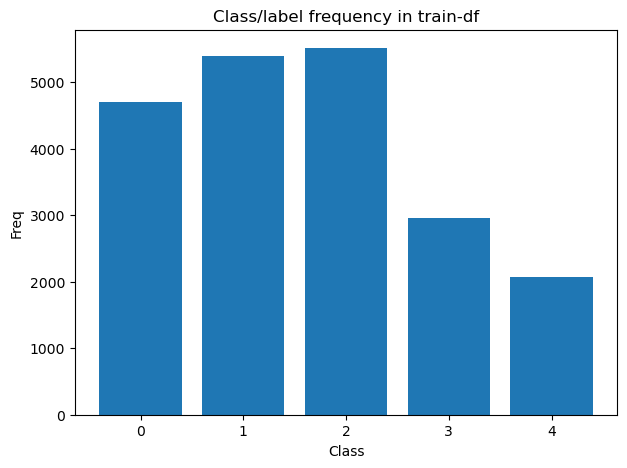

In [69]:
# Verify label/class distribution
import matplotlib.pyplot as plt

plt.figure(figsize=(7, 5))
plt.bar(
    x=train_df["Stage"].value_counts().keys(),
    height=train_df["Stage"].value_counts().values
)
plt.title("Class/label frequency in train-df")
plt.xlabel("Class")
plt.ylabel("Freq")
plt.show();

In [70]:
sensor_names = train_df.keys()[5:-1]
sensor_names

Index(['Sensor 1', 'Sensor 2', 'Sensor 3', 'Sensor 4', 'Sensor 5', 'Sensor 6',
       'Sensor 7', 'Sensor 8', 'Sensor 9', 'Sensor 10', 'Sensor 11',
       'Sensor 12', 'Sensor 13', 'Sensor 14', 'Sensor 15', 'Sensor 16',
       'Sensor 17', 'Sensor 18', 'Sensor 19', 'Sensor 20', 'Sensor 21'],
      dtype='object')

/var/folders/pc/8b_z8xc17d33jmyzppszfkb00000gn/T/ipykernel_40036/615041610.py:21: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



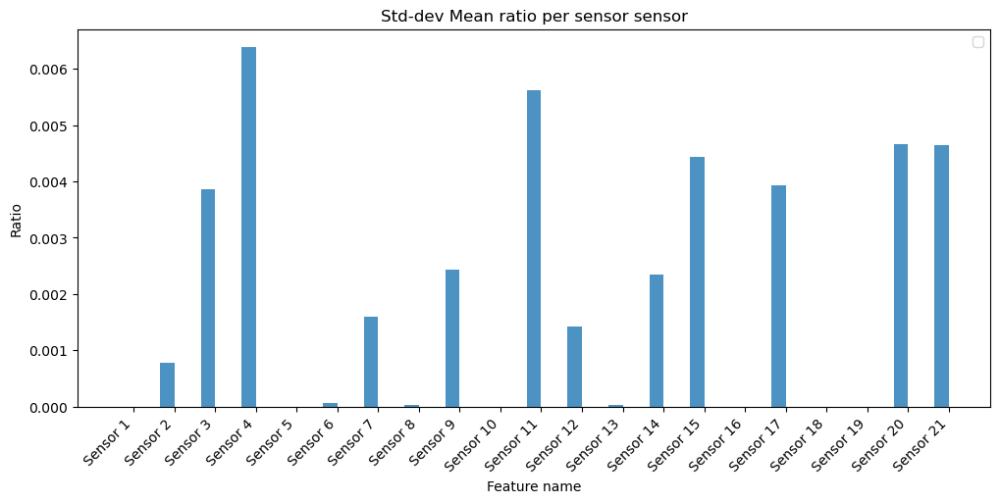

In [71]:
# Check std-dev per feature
import numpy as np

desc = train_df[sensor_names].describe()
means = desc.loc["mean"]
stds = desc.loc["std"]
mean_to_std_ratios = means/stds
std_to_mean_ratios = stds/means

x = np.arange(len(sensor_names))
width = 0.35

plt.figure(figsize=(12, 5))

plt.bar(x-width/2, std_to_mean_ratios.values, width, alpha=0.8)

plt.xticks(x, sensor_names, rotation=45, ha="right")
plt.title("Std-dev Mean ratio per sensor sensor")
plt.xlabel("Feature name")
plt.ylabel("Ratio")
plt.legend()
plt.show();

In [72]:
# Sensors to keep
all_sensors = [f"Sensor {i}" for i in range(1, 22)]
sensors_to_keep = [2, 3, 4, 7, 9, 11, 12, 14, 15, 17, 20, 21]
sensor_names = [f"Sensor {i}" for i in sensors_to_keep]
sensors_to_drop = list(set(all_sensors) - set(sensor_names))
train_df_clean = train_df.drop(columns=sensors_to_drop)
train_df_clean.head()

,Engine no,Num cycles,Operating 1,Operating 2,Operating 3,Sensor 2,Sensor 3,Sensor 4,Sensor 7,Sensor 9,Sensor 11,Sensor 12,Sensor 14,Sensor 15,Sensor 17,Sensor 20,Sensor 21,Stage
0,1,2,0.0019,-0.0003,100.0,642.15,1591.82,1403.14,553.75,9044.07,47.49,522.28,8131.49,8.4318,392,39.00,23.4236,0
1,1,3,-0.0043,0.0003,100.0,642.35,1587.99,1404.20,554.26,9052.94,47.27,522.42,8133.23,8.4178,390,38.95,23.3442,0
2,1,4,0.0007,0.0000,100.0,642.35,1582.79,1401.87,554.45,9049.48,47.13,522.86,8133.83,8.3682,392,38.88,23.3739,0
3,1,5,-0.0019,-0.0002,100.0,642.37,1582.85,1406.22,554.00,9055.15,47.28,522.19,8133.80,8.4294,393,38.90,23.4044,0
4,1,6,-0.0043,-0.0001,100.0,642.10,1584.47,1398.37,554.67,9049.68,47.16,521.68,8132.85,8.4108,391,38.98,23.3669,0


In [73]:
# Check std-dev per operating condition
train_df[[f"Operating {i}" for i in range(1, 3+1)]].describe()

,Operating 1,Operating 2,Operating 3
count,20630.000000,20630.000000,20630.0
mean,-0.000009,0.000002,100.0
std,0.002187,0.000293,0.0
min,-0.008700,-0.000600,100.0
25%,-0.001500,-0.000200,100.0
50%,-0.000000,0.000000,100.0
75%,0.001500,0.000300,100.0
max,0.008700,0.000600,100.0


Looks like the operating conditions are similar for all the engines, so we can safely drop them.

In [74]:
train_df_clean = train_df_clean.drop([f"Operating {i}" for i in [1, 2, 3]], axis=1)
train_df_clean.head()

,Engine no,Num cycles,Sensor 2,Sensor 3,Sensor 4,Sensor 7,Sensor 9,Sensor 11,Sensor 12,Sensor 14,Sensor 15,Sensor 17,Sensor 20,Sensor 21,Stage
0,1,2,642.15,1591.82,1403.14,553.75,9044.07,47.49,522.28,8131.49,8.4318,392,39.00,23.4236,0
1,1,3,642.35,1587.99,1404.20,554.26,9052.94,47.27,522.42,8133.23,8.4178,390,38.95,23.3442,0
2,1,4,642.35,1582.79,1401.87,554.45,9049.48,47.13,522.86,8133.83,8.3682,392,38.88,23.3739,0
3,1,5,642.37,1582.85,1406.22,554.00,9055.15,47.28,522.19,8133.80,8.4294,393,38.90,23.4044,0
4,1,6,642.10,1584.47,1398.37,554.67,9049.68,47.16,521.68,8132.85,8.4108,391,38.98,23.3669,0


In [75]:
# Get the sensor names and numbers
sensor_names = [f"Sensor {i}" for i in sensors_to_keep]
sensor_names, sensors_to_keep

(['Sensor 2',
  'Sensor 3',
  'Sensor 4',
  'Sensor 7',
  'Sensor 9',
  'Sensor 11',
  'Sensor 12',
  'Sensor 14',
  'Sensor 15',
  'Sensor 17',
  'Sensor 20',
  'Sensor 21'],
 [2, 3, 4, 7, 9, 11, 12, 14, 15, 17, 20, 21])

This will make it easier to use the relevant sensor data when building the classifier.

# Outlier handling
1. Detect outliers using z-score, IQR, or visual methods (boxplots per sensor)
2. Replace with rolling median/mean/std-dev insead of droping
3. Optionally log outlier rate per sensor

## Finding outliers

In [76]:
from scipy.stats import zscore

# Get zscores
z_scores = np.abs(zscore(train_df_clean[sensor_names]))
outlier_mask = (z_scores > 3)
outlier_percent = (outlier_mask.sum(axis=0) / len(train_df_clean)) * 100
outlier_percent = pd.Series(outlier_percent, index=sensor_names).sort_values(ascending=False)

print("Outlier percentages per sensor (z_score > 3):")
print(outlier_percent)

Outlier percentages per sensor (z_score > 3):
Sensor 9     2.525448
Sensor 14    2.404266
Sensor 17    0.392632
Sensor 3     0.227824
Sensor 20    0.208434
Sensor 4     0.174503
Sensor 7     0.164809
Sensor 12    0.164809
Sensor 21    0.164809
Sensor 15    0.159961
Sensor 2     0.150267
Sensor 11    0.111488
dtype: float64


In [77]:
# IQR
def get_outlier_counts(df, verbose=True):
    outlier_counts = {}
    
    for sensor in sensor_names:
        Q1 = df[sensor].quantile(0.25)
        Q3 = df[sensor].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        outliers = ((df[sensor] < lower_bound) | (df[sensor] > upper_bound)).sum()
        outlier_counts[sensor] = outliers
    
    iqr_outliers = pd.Series(outlier_counts).sort_values(ascending=False)
    if verbose:
        print("Outlier count per sensor:")
        print(iqr_outliers)
        print(f"Total number of outliers: {iqr_outliers.sum()}")
    return iqr_outliers.sum()

get_outlier_counts(train_df_clean)

Outlier count per sensor:
Sensor 9     1686
Sensor 14    1543
Sensor 11     167
Sensor 3      165
Sensor 12     146
Sensor 2      139
Sensor 21     136
Sensor 15     120
Sensor 4      119
Sensor 20     117
Sensor 7      110
Sensor 17      81
dtype: int64
Total number of outliers: 4529


np.int64(4529)

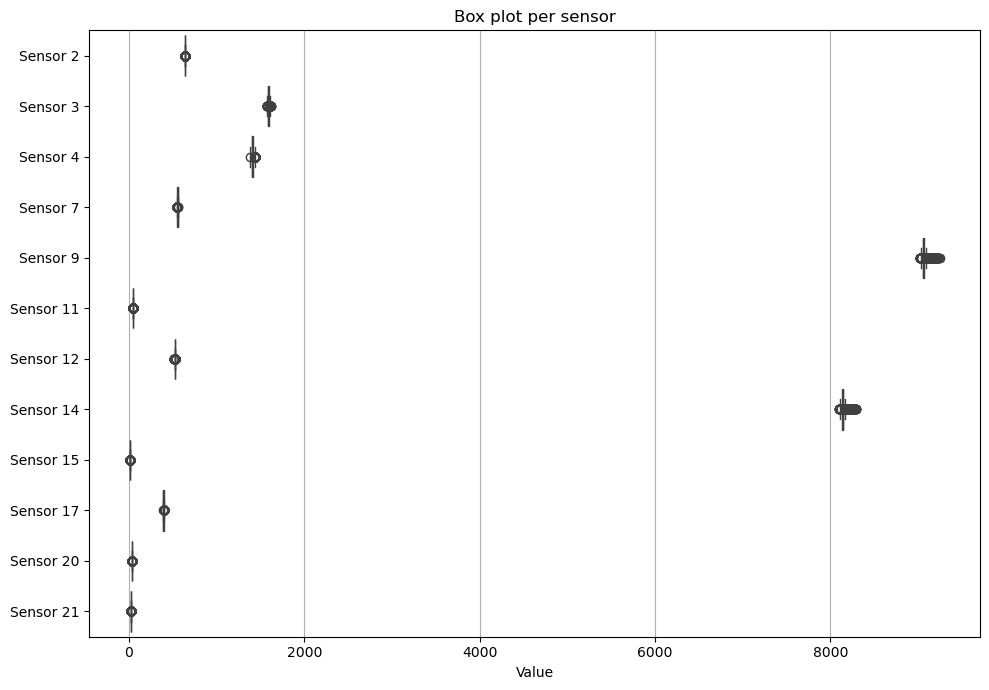

In [78]:
# Box plots to visualize
import seaborn as sns
plt.figure(figsize=(10, 7))
sns.boxplot(data=train_df_clean[sensor_names], orient="h")
plt.title("Box plot per sensor")
plt.xlabel("Value")
plt.grid(axis="x")
plt.tight_layout()
plt.show();

## Replace outliers
We will not get ridd of the outlier rows since thet are more than 10% of the train-split's size. So we have to replace them.

Lets replace the outliers with a sensor reading of a similar sample.\
So we will simply replace the outlier's sensor reading with nearest neihbor's median.

### Imputation using `IterativeImputer`

In [79]:
# Get outliers
from scipy.stats import zscore
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

def iter_imputer(df):
    # Get zscore
    z_scores = np.abs(zscore(df[sensor_names]))
    outlier_mask = z_scores > 3
    df_nan = df.copy()
    df_nan[sensor_names] = df_nan[sensor_names].mask(outlier_mask, np.nan)
    
    # Imputing the outliers
    imputer = IterativeImputer(random_state=42, max_iter=10)
    df_imputed = pd.DataFrame(
        imputer.fit_transform(df_nan[sensor_names]),
        columns=sensor_names,
        index=df_nan.index,
    )
    df_final = df_nan.copy()
    df_final[sensor_names] = df_imputed
    return df_final

# Impute
df_imputed = iter_imputer(df=train_df_clean)

# Verify removal of outliers
get_outlier_counts(df_imputed)

Outlier count per sensor:
Sensor 9     1392
Sensor 14    1234
Sensor 11     144
Sensor 3      118
Sensor 12     112
Sensor 2      108
Sensor 21     102
Sensor 15      87
Sensor 4       83
Sensor 7       76
Sensor 20      74
Sensor 17       0
dtype: int64
Total number of outliers: 3530


np.int64(3530)

Reduced the number of outliers by (approx) 800. But there are many remaining.

### Imputation using `KNNImputer`

In [80]:
# Impute using KNN
from sklearn.impute import KNNImputer
def knn_imputer(df):
    z_scores = np.abs(zscore(df[sensor_names]))
    outlier_mask = z_scores > 3
    
    df_nan = df.copy()
    df_nan[sensor_names] = df_nan[sensor_names].mask(outlier_mask, np.nan)
    
    imputer = KNNImputer(n_neighbors=10)
    df_imputed = pd.DataFrame(
        imputer.fit_transform(df_nan[sensor_names]),
        columns=sensor_names,
        index=df_nan.index,
    )
    
    df_final = df_nan.copy()
    df_final[sensor_names] = df_imputed
    return df_final

# Impute
df_imputed = knn_imputer(df=df_imputed)

# Verify removal of outliers
get_outlier_counts(df_imputed)

Outlier count per sensor:
Sensor 9     1071
Sensor 14     936
Sensor 11     137
Sensor 3      112
Sensor 12     112
Sensor 2      101
Sensor 21      99
Sensor 15      84
Sensor 4       81
Sensor 7       75
Sensor 20      74
Sensor 17       0
dtype: int64
Total number of outliers: 2882


np.int64(2882)

This is much better, but we can perform a 2nd pass to reduce the number of outliers more

In [81]:
# Lets repeat a mix of iter+knn imputation until we converge
prev_outliers = float("inf")
curr_outliers = 0
while True:
    df_imputed = iter_imputer(df_imputed)
    df_imputed = knn_imputer(df_imputed)
    curr_outliers = get_outlier_counts(df_imputed, False)
    if curr_outliers >= prev_outliers:
        get_outlier_counts(df_imputed)
        break
    prev_outliers = curr_outliers

Outlier count per sensor:
Sensor 9     797
Sensor 14    687
Sensor 11    137
Sensor 12    112
Sensor 3     111
Sensor 21     99
Sensor 2      98
Sensor 15     84
Sensor 4      81
Sensor 7      75
Sensor 20     74
Sensor 17      0
dtype: int64
Total number of outliers: 2355


Nice, looks like we nearly halved the number of outliers from the dataset.\
Before eliminating the remaining outliers lets quickly check the box plots to verify their elimination.

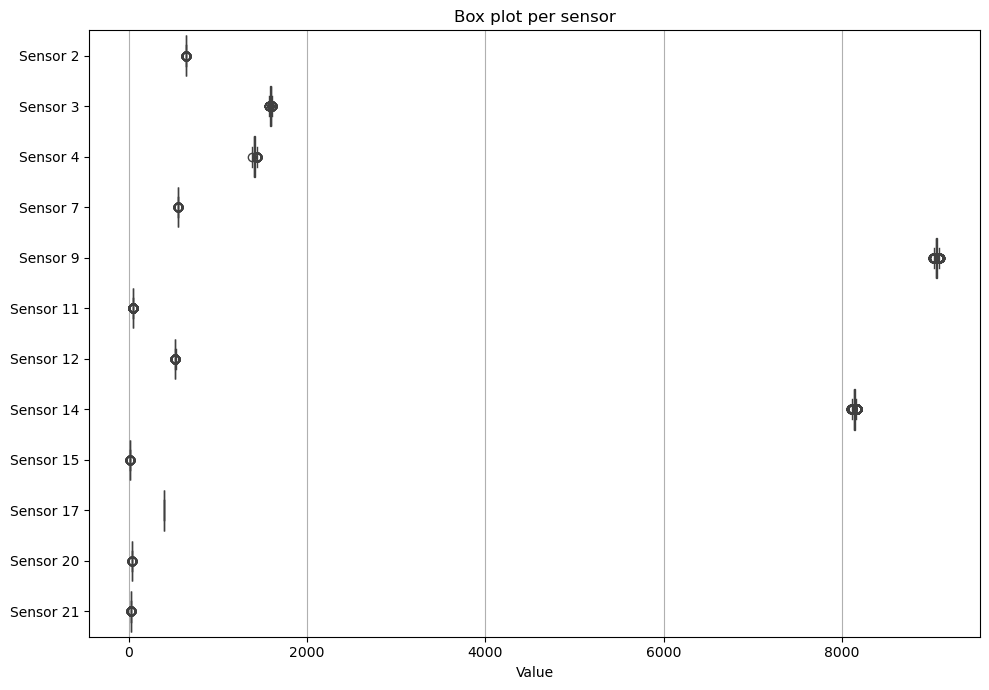

In [82]:
# Box plots to visualize
import seaborn as sns
plt.figure(figsize=(10, 7))
sns.boxplot(data=df_imputed[sensor_names], orient="h")
plt.title("Box plot per sensor")
plt.xlabel("Value")
plt.grid(axis="x")
plt.tight_layout()
plt.show();

This is a realistic number of outliers and its a good idea to keep them in the dataset as-it-is. The model needs to be able to "understand" and adapt to the outliers, these outliers will occur in the test set too, so keeping them will not harm the model much.

Total number of outliers now: 1783\
Number of outliers overall(%): $\frac{1783}{16504}*100 = 10.80\% $

This is completely fine.

In [83]:
# Saving data into train-df
train_df_clean[sensor_names] = df_imputed[sensor_names]
get_outlier_counts(train_df_clean)

Outlier count per sensor:
Sensor 9     797
Sensor 14    687
Sensor 11    137
Sensor 12    112
Sensor 3     111
Sensor 21     99
Sensor 2      98
Sensor 15     84
Sensor 4      81
Sensor 7      75
Sensor 20     74
Sensor 17      0
dtype: int64
Total number of outliers: 2355


np.int64(2355)

# Exploratory data analysis
1. Check class distribution (Stage 0-4)
2. Visualize sensor value distributions by stage
3. Visualize pairplots or PCA by stage label
4. Correlation-matrix (heatmap) with label to find informative sensors

## Checking class distribution

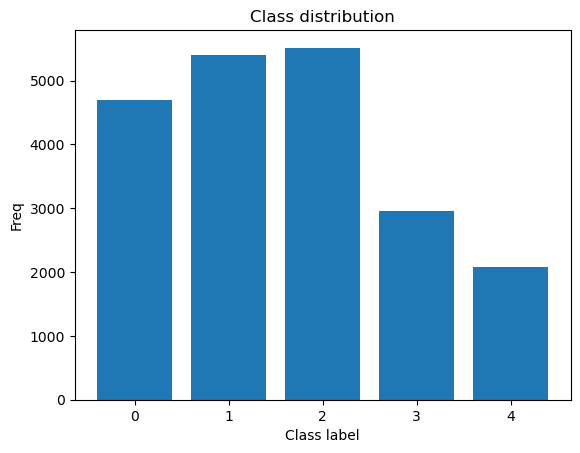

In [84]:
plt.bar(
    x=train_df_clean["Stage"].value_counts().keys(),
    height=train_df_clean["Stage"].value_counts().values
)
plt.title("Class distribution")
plt.xlabel("Class label")
plt.ylabel("Freq")
plt.show();

Labels 3-4 have the least number of samples. This may lead to class-imbalance issues later, so we have to keep a close on eye on this.\
We may need to use techniques like SMOTE to reduce the class imbalance (especially for stage-4)

## Sensor value distributions by sensor

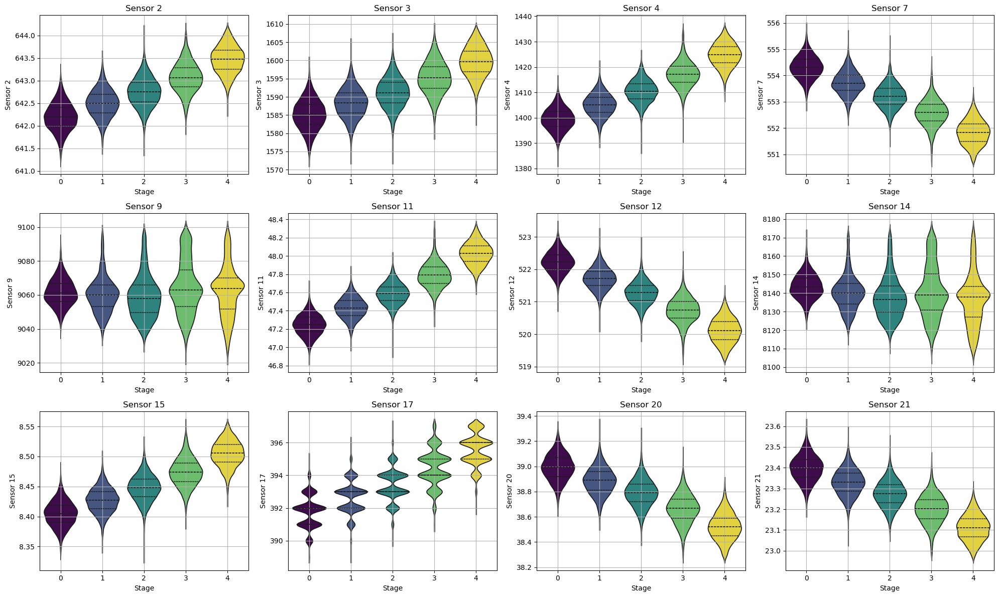

In [85]:
def plot_sensor_distributions_by_stage(df, sensor_names, max_cols=4):
    n_sensors = len(sensor_names)
    n_rows = (n_sensors + max_cols - 1) // max_cols

    plt.figure(figsize=(5 * max_cols, 4 * n_rows))

    for idx, sensor in enumerate(sensor_names):
        plt.subplot(n_rows, max_cols, idx + 1)
        sns.violinplot(x="Stage",
                       y=sensor,
                       data=df,
                       inner="quartile",
                       hue="Stage",
                       palette="viridis")
        plt.title(sensor)
        plt.grid(True)
        plt.legend().set_visible(False)

    plt.tight_layout()
    plt.show()
plot_sensor_distributions_by_stage(train_df_clean, sensor_names)

## Running Kruskal-Wallis H-Test
This will allow us to understand which sensor is important (if so, how much)

In [86]:
from scipy.stats import kruskal
import pandas as pd

kruskal_results = {}

for sensor in sensor_names:
    groups = [train_df_clean[train_df_clean["Stage"] == stage][sensor] for stage in sorted(train_df_clean["Stage"].unique())]
    stat, p = kruskal(*groups)
    kruskal_results[sensor] = p

kruskal_df = pd.Series(kruskal_results).sort_values()
print("Kruskal-Wallis p-values (lower = more discriminative):")
print(kruskal_df)


Kruskal-Wallis p-values (lower = more discriminative):
Sensor 2      0.000000e+00
Sensor 3      0.000000e+00
Sensor 4      0.000000e+00
Sensor 7      0.000000e+00
Sensor 11     0.000000e+00
Sensor 12     0.000000e+00
Sensor 15     0.000000e+00
Sensor 17     0.000000e+00
Sensor 20     0.000000e+00
Sensor 21     0.000000e+00
Sensor 14    1.355860e-297
Sensor 9      5.833992e-93
dtype: float64


Looks like all the sensors are important. Sensor(s) 9 and 14 seem to be less impactful, but given how small their 'p' is, its ok to keep them too.

## Running ANOVA F-test
Same purpose as Kruskal-Wallis

In [87]:
from scipy.stats import f_oneway

anova_results = {}

for sensor in sensor_names:
    groups = [train_df_clean[train_df_clean["Stage"] == stage][sensor] for stage in sorted(train_df_clean["Stage"].unique())]
    stat, p = f_oneway(*groups)
    anova_results[sensor] = p

anova_df = pd.Series(anova_results).sort_values()
print("ANOVA p-values (lower = better):")
print(anova_df)


ANOVA p-values (lower = better):
Sensor 2      0.000000e+00
Sensor 3      0.000000e+00
Sensor 4      0.000000e+00
Sensor 7      0.000000e+00
Sensor 11     0.000000e+00
Sensor 12     0.000000e+00
Sensor 15     0.000000e+00
Sensor 17     0.000000e+00
Sensor 20     0.000000e+00
Sensor 21     0.000000e+00
Sensor 14    6.192164e-202
Sensor 9      2.376259e-91
dtype: float64


We can keep all sensors

In [88]:
# All in one place
summary_df = pd.DataFrame({
    "Kruskal_p": kruskal_df,
    "ANOVA_p": anova_df
}).sort_values("Kruskal_p")

summary_df

,Kruskal_p,ANOVA_p
Sensor 2,0.000000e+00,0.000000e+00
Sensor 3,0.000000e+00,0.000000e+00
Sensor 4,0.000000e+00,0.000000e+00
Sensor 7,0.000000e+00,0.000000e+00
Sensor 11,0.000000e+00,0.000000e+00
Sensor 12,0.000000e+00,0.000000e+00
Sensor 15,0.000000e+00,0.000000e+00
Sensor 17,0.000000e+00,0.000000e+00
Sensor 20,0.000000e+00,0.000000e+00
Sensor 21,0.000000e+00,0.000000e+00


## Pairplots and PCA by stage label

<Figure size 1400x700 with 0 Axes>

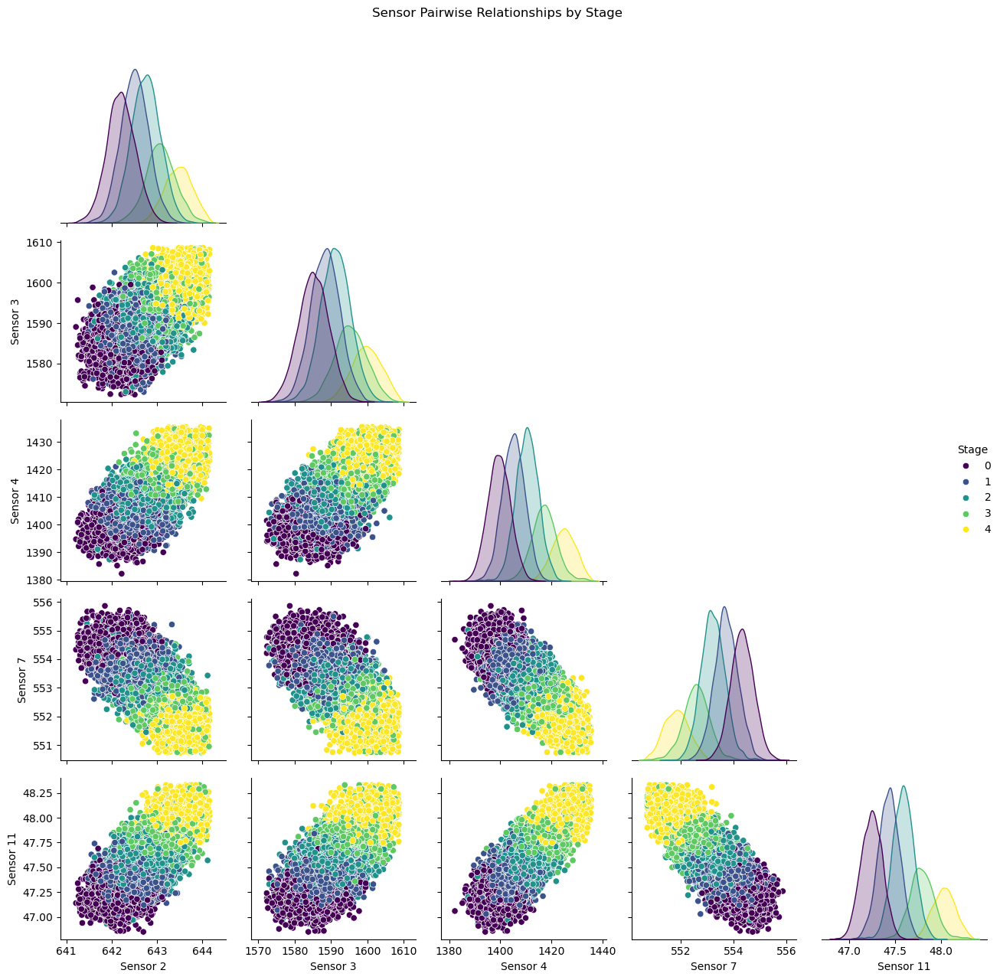

In [89]:
top_sensors = summary_df.head(5).index.tolist()  # Ge top-5 sensors (for the pairplot)
plot_df = train_df_clean[top_sensors + ["Stage"]].copy()

plt.figure(figsize=(14, 7))
sns.pairplot(plot_df, hue="Stage", palette="viridis", corner=True)
plt.suptitle("Sensor Pairwise Relationships by Stage", y=1.02)
plt.tight_layout()
plt.show();

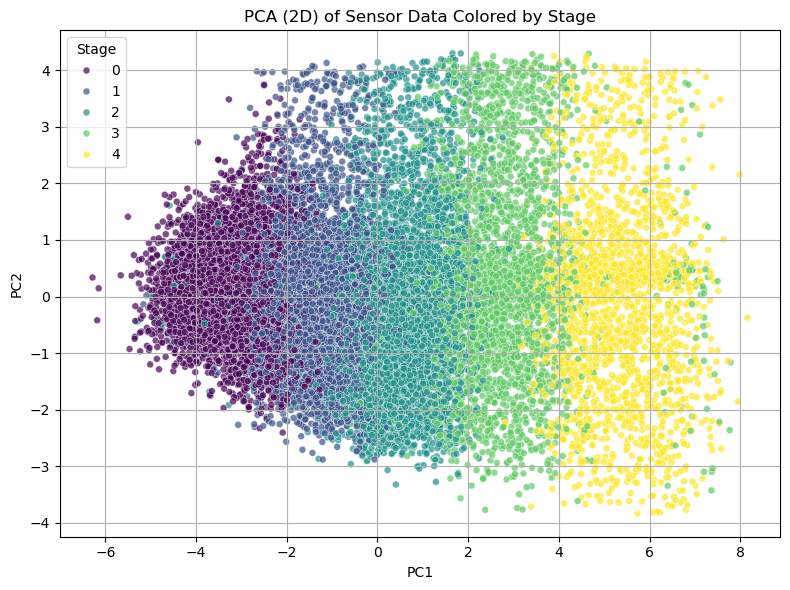

In [90]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

X = train_df_clean[sensor_names]
X_std = StandardScaler().fit_transform(X)

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_std)

pca_df = pd.DataFrame({
    "PC1": X_pca[:, 0],
    "PC2": X_pca[:, 1],
    "Stage": train_df_clean["Stage"]
})

plt.figure(figsize=(8, 6))
sns.scatterplot(data=pca_df, x="PC1", y="PC2", hue="Stage", palette="viridis", alpha=0.7, s=25)
plt.title("PCA (2D) of Sensor Data Colored by Stage")
plt.grid(True)
plt.tight_layout()
plt.show()


In [57]:
# Get a 3d-interactive t-SNE plot
import plotly.express as px
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler

X = train_df_clean[sensor_names].values
X_scaled = StandardScaler().fit_transform(X)

tsne = TSNE(n_components=3, perplexity=30, max_iter=1000, random_state=42)
X_tsne = tsne.fit_transform(X_scaled)

In [58]:
tsne_df = pd.DataFrame({
    "TSNE1": X_tsne[:, 0],
    "TSNE2": X_tsne[:, 1],
    "TSNE3": X_tsne[:, 2],
    "Stage": train_df_clean["Stage"]
})

fig = px.scatter_3d(
    tsne_df,
    x="TSNE1", y="TSNE2", z="TSNE3",
    color="Stage",
    color_continuous_scale="Viridis",
    title="3D t-SNE Projection of Engine Sensor Data",
    opacity=0.7,
    height=700
)
fig.show()


We see that the stages are reltively simple to seperate from the plot above.\
Since we are more interested in engines classified in stages 3 and 4, lets visualize them using t-SNE

In [59]:
# Filter for stages 3 and 4 and visualize them too
df_34 = train_df_clean[train_df_clean["Stage"].isin([3, 4])].copy()
X_34 = df_34[sensor_names].values
X_34_scaled = StandardScaler().fit_transform(X_34)

tsne = TSNE(n_components=3, perplexity=30, max_iter=1000, random_state=42)
X_34_tsne = tsne.fit_transform(X_34_scaled)
#
# Create the plot
tsne_df_34 = pd.DataFrame({
    "TSNE1": X_34_tsne[:, 0],
    "TSNE2": X_34_tsne[:, 1],
    "TSNE3": X_34_tsne[:, 2],
    "Stage": df_34["Stage"].values
})

fig = px.scatter_3d(
    tsne_df_34,
    x="TSNE1", y="TSNE2", z="TSNE3",
    color="Stage",
    color_continuous_scale="Viridis",
    title="3D t-SNE: Stages 3 and 4",
    opacity=0.7,
    height=700
)
fig.show()


We see that the classes are relatively easy to distinguish with a bit of overlapping. This may cause problems later, but its something to keep in mind. This is expected, we saw a similar behaviuour in Phase-1 where the labels in the stage-4 region were 'oscillating'. Again this is fine, as we saw that behavious for engines in their 'transition' phase from stage-3 to stage-4. Once an engine is in stage-4 territory, the labells never oscillated.

## Corr-mat b/w sensors

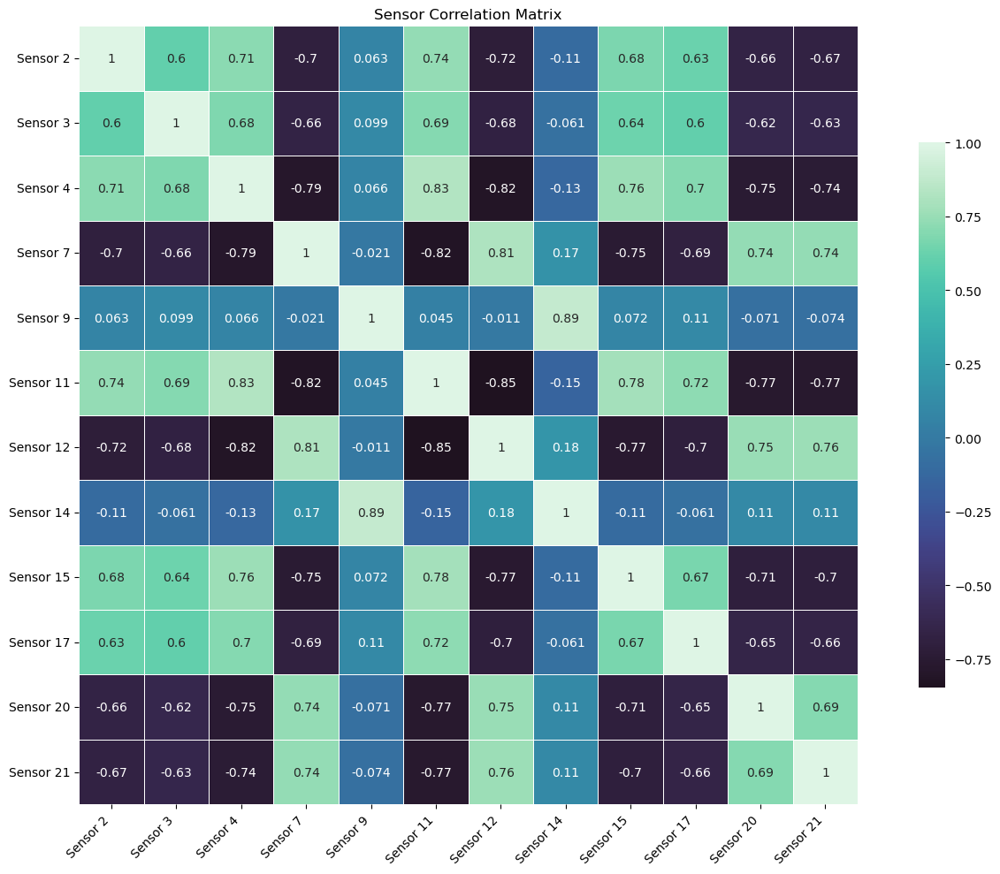

In [91]:
corr_matrix = train_df_clean[sensor_names].corr()

plt.figure(figsize=(14, 10))
sns.heatmap(corr_matrix, annot=True, cmap='mako', center=0, square=True,
            cbar_kws={"shrink": 0.7}, linewidths=0.5)
plt.title("Sensor Correlation Matrix")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()


In my experiance, we can 'merge' any 2 sensors with a correlation of (>=) 0.9. Here we see that a few sensors get close to that, but not quite 0.9 (or greater). So we needn't remove any more features. The same goes for the -ve(ly) correlated features.

# Feature engineering
1. Add rolling mean,std, min, max over a window (5ish cycles) as a new feature
2. Add deltas: difference b/w current and preious cycle
3. Time sinze last stage change (temporal affinities)
4. Drop highly correlated or low variance features

In [92]:
# All feature eng stuff
def add_rolling_stats(df, sensor_cols, window=5):
    """Add rolling mean, std, min, max for each sensor."""
    for col in sensor_cols:
        df[f'{col}_roll_mean'] = df[col].rolling(window=window, min_periods=1).mean()
        df[f'{col}_roll_std'] = df[col].rolling(window=window, min_periods=1).std()
        df[f'{col}_roll_min'] = df[col].rolling(window=window, min_periods=1).min()
        df[f'{col}_roll_max'] = df[col].rolling(window=window, min_periods=1).max()
    return df

def add_deltas(df, sensor_cols):
    """Add delta features: difference between current and previous cycle."""
    for col in sensor_cols:
        df[f'{col}_delta'] = df[col].diff().fillna(0)  # First difference is 0
    return df

def add_time_since_stage_change(df):
    """Calculate time since the last stage change."""
    df['time_since_stage_change'] = 0
    last_change = 0
    for i in range(1, len(df)):
        # Access the current and previous stages using iloc
        current_stage = df.iloc[i]['Stage']
        previous_stage = df.iloc[i - 1]['Stage']
        if current_stage != previous_stage:
            last_change = i
        df.loc[df.index[i], 'time_since_stage_change'] = i - last_change
    return df

def drop_correlated_and_low_variance(df, threshold_corr=0.9, threshold_var=1e-5):
    """Drop highly correlated or low variance features."""
    # Drop low variance features
    low_variance_cols = df.loc[:, df.var() < threshold_var].columns.tolist()
    df = df.drop(columns=low_variance_cols)
    print(f"Dropped low variance features: {low_variance_cols}")

    # Drop highly correlated features
    corr_matrix = df.corr().abs()
    upper_triangle = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

    # Find features with correlation above the threshold
    to_drop = [column for column in upper_triangle.columns if any(upper_triangle[column] > threshold_corr)]
    df = df.drop(columns=to_drop)
    print(f"Dropped highly correlated features: {to_drop}")

    return df


In [93]:
sensor_names
df_clean = train_df_clean.copy()
df_clean = add_rolling_stats(df_clean, sensor_names)
df_clean = add_deltas(df_clean, sensor_names)
df_clean = add_time_since_stage_change(df_clean)
df_clean = drop_correlated_and_low_variance(df_clean)

df_clean.head()

Dropped low variance features: []
Dropped highly correlated features: ['Sensor 2_roll_mean', 'Sensor 2_roll_min', 'Sensor 2_roll_max', 'Sensor 3_roll_min', 'Sensor 3_roll_max', 'Sensor 4_roll_mean', 'Sensor 4_roll_min', 'Sensor 4_roll_max', 'Sensor 7_roll_mean', 'Sensor 7_roll_min', 'Sensor 7_roll_max', 'Sensor 9_roll_mean', 'Sensor 9_roll_min', 'Sensor 9_roll_max', 'Sensor 11_roll_mean', 'Sensor 11_roll_min', 'Sensor 11_roll_max', 'Sensor 12_roll_mean', 'Sensor 12_roll_min', 'Sensor 12_roll_max', 'Sensor 14_roll_mean', 'Sensor 14_roll_min', 'Sensor 14_roll_max', 'Sensor 15_roll_mean', 'Sensor 15_roll_min', 'Sensor 15_roll_max', 'Sensor 17_roll_mean', 'Sensor 17_roll_min', 'Sensor 17_roll_max', 'Sensor 20_roll_mean', 'Sensor 20_roll_min', 'Sensor 20_roll_max', 'Sensor 21_roll_mean', 'Sensor 21_roll_min', 'Sensor 21_roll_max']


,Engine no,Num cycles,Sensor 2,Sensor 3,Sensor 4,Sensor 7,Sensor 9,Sensor 11,Sensor 12,Sensor 14,...,Sensor 7_delta,Sensor 9_delta,Sensor 11_delta,Sensor 12_delta,Sensor 14_delta,Sensor 15_delta,Sensor 17_delta,Sensor 20_delta,Sensor 21_delta,time_since_stage_change
0,1,2,642.15,1591.82,1403.14,553.75,9044.07,47.49,522.28,8131.49,...,0.00,0.00,0.00,0.00,0.00,0.0000,0.0,0.00,0.0000,0
1,1,3,642.35,1587.99,1404.20,554.26,9052.94,47.27,522.42,8133.23,...,0.51,8.87,-0.22,0.14,1.74,-0.0140,-2.0,-0.05,-0.0794,1
2,1,4,642.35,1582.79,1401.87,554.45,9049.48,47.13,522.86,8133.83,...,0.19,-3.46,-0.14,0.44,0.60,-0.0496,2.0,-0.07,0.0297,2
3,1,5,642.37,1582.85,1406.22,554.00,9055.15,47.28,522.19,8133.80,...,-0.45,5.67,0.15,-0.67,-0.03,0.0612,1.0,0.02,0.0305,3
4,1,6,642.10,1584.47,1398.37,554.67,9049.68,47.16,521.68,8132.85,...,0.67,-5.47,-0.12,-0.51,-0.95,-0.0186,-2.0,0.08,-0.0375,4


In [102]:
train_df_clean = df_clean

In [104]:
# Split data
from sklearn.model_selection import train_test_split
train_df, test_df = train_test_split(train_df_clean, test_size=0.2, shuffle=True, random_state=42)
train_df.shape, test_df.shape

((16504, 41), (4126, 41))

In [105]:
train_df.head()

,Engine no,Num cycles,Sensor 2,Sensor 3,Sensor 4,Sensor 7,Sensor 9,Sensor 11,Sensor 12,Sensor 14,...,Sensor 7_delta,Sensor 9_delta,Sensor 11_delta,Sensor 12_delta,Sensor 14_delta,Sensor 15_delta,Sensor 17_delta,Sensor 20_delta,Sensor 21_delta,time_since_stage_change
11067,56,89,642.92,1588.62,1414.80,553.11,9050.05,47.45,521.36,8132.63,...,0.16,0.70,-0.20,0.19,-0.06,0.0295,0.0,0.07,0.0351,18
6244,32,25,642.90,1588.45,1414.77,553.52,9052.01,47.50,521.37,8134.85,...,0.61,-1.68,0.07,-0.16,1.73,0.0282,0.0,0.00,-0.0298,23
9380,48,117,642.39,1580.64,1406.38,554.71,9073.18,47.36,521.88,8152.61,...,0.41,-5.55,-0.06,-0.88,-2.27,0.0574,2.0,0.04,0.0033,114
6105,31,120,642.42,1587.09,1402.37,554.58,9056.19,47.27,522.13,8139.80,...,1.27,8.42,0.10,0.32,1.37,0.0101,0.0,-0.31,0.2800,117
15825,79,73,641.81,1589.23,1401.56,554.98,9056.93,47.26,522.59,8139.82,...,0.69,-0.56,-0.07,0.39,-4.00,-0.0464,0.0,0.03,0.0544,70


In [106]:
test_df.head()

,Engine no,Num cycles,Sensor 2,Sensor 3,Sensor 4,Sensor 7,Sensor 9,Sensor 11,Sensor 12,Sensor 14,...,Sensor 7_delta,Sensor 9_delta,Sensor 11_delta,Sensor 12_delta,Sensor 14_delta,Sensor 15_delta,Sensor 17_delta,Sensor 20_delta,Sensor 21_delta,time_since_stage_change
13857,69,228,642.22,1586.72,1411.47,553.770000,9057.73,47.43,520.71,8137.20,...,0.710000,-4.500000,-0.14,-0.63,-3.890000,0.0045,2.0,-0.13,0.1134,4
1710,8,149,643.87,1605.12,1428.29,551.305208,9047.30,48.09,519.31,8121.93,...,-0.424792,8.730000,-0.04,-0.56,-4.270000,0.0266,1.0,-0.29,0.0177,26
9278,48,15,642.17,1587.61,1394.65,554.160000,9070.49,47.31,522.47,8148.07,...,-0.060000,1.260000,0.30,0.31,4.540000,0.0199,2.0,0.18,0.1015,12
10786,55,1,642.58,1583.77,1407.45,554.390000,9041.62,47.39,521.50,8133.23,...,3.020000,-23.737572,-0.76,1.93,-3.948009,-0.1008,-2.0,0.65,0.3457,1
19709,96,159,641.55,1589.51,1406.72,553.660000,9049.14,47.63,521.47,8133.46,...,-0.440000,-10.320000,0.31,-0.13,-8.500000,0.0454,1.0,-0.21,-0.0436,27


# Modeling
1. Logistic regression (w/ `class_weights = "balanced"`)
2. SVM (linear, RBF)
3. Random forest
4. XGBoost (handle imbalance with `scale_pos_weight`)
5. Try pipelines with `StandardScaler` and `MinMaxScaler`

Model table:
|S.no|Model name|Algorithm|
|-|-|-|
|1|Model-1|Logistic regression|
|2|Model-2|SVM|
|3|Model-3|Random forest|
|4|Model-4|XGBoost|

*Will add other models as we keep testing*

## Helpers and data
These are some of the funtions that will help evaluate and compare models

Functions here:
- fit_and_evaluate_model()
- plot_cv_scores()
- compare_models_metric()
- plot_confusion()
- compare_models_multiple_metrics()

We will also split the data into feature-label splits for ease of use

In [107]:
# Evaluation related stuff
from sklearn.metrics import (
    accuracy_score, f1_score, precision_score, recall_score, confusion_matrix,
    classification_report, cohen_kappa_score, matthews_corrcoef, balanced_accuracy_score
)
from sklearn.model_selection import cross_val_score
from sklearn.metrics import ConfusionMatrixDisplay

def fit_and_evaluate_model(model, X_train, y_train, X_test, y_test, cv_folds=5, average_type="weighted"):
    """
    Trains and evlautes a model and returns its results on the given data.
    
    Args:
        model: model to fit/train
        X_train: train features
        y_train: train labels
        X_test: test features
        y_test: test labels
        cv_folds: 'k' in k-cross-validation (number of folds)
        average_type: used for f1 score (weighted is the default)
    Returns:
        tuple(model, results)
        
        model: fitted model on (X_train, y_train)
        results: a dict with the model's results, which includes: acc, f1, precision, recall...
                 explore what 'results' contains by using results.keys()
    """
    results = {}

    # Fit model
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    # Test-set metrics
    results["test_accuracy"] = accuracy_score(y_test, y_pred)
    results["test_f1"] = f1_score(y_test, y_pred, average=average_type)
    results["test_precision"] = precision_score(y_test, y_pred, average=average_type)
    results["test_recall"] = recall_score(y_test, y_pred, average=average_type)
    results["test_balanced_accuracy"] = balanced_accuracy_score(y_test, y_pred)
    results["test_kappa"] = cohen_kappa_score(y_test, y_pred)
    results["test_mcc"] = matthews_corrcoef(y_test, y_pred)
    results["confusion_matrix"] = confusion_matrix(y_test, y_pred)
    results["classification_report"] = classification_report(y_test, y_pred, digits=3)

    # CV - acc and f1 scores
    cv_acc = cross_val_score(model, X_train, y_train, cv=cv_folds, scoring="accuracy")
    cv_f1  = cross_val_score(model, X_train, y_train, cv=cv_folds, scoring=f"f1_{average_type}")

    results["cv_accuracy_mean"] = np.mean(cv_acc)
    results["cv_f1_mean"]       = np.mean(cv_f1)
    results["cv_accuracy_std"]  = np.std(cv_acc)
    results["cv_f1_std"]        = np.std(cv_f1)

    return model, results


def plot_cv_scores(scores, metric_name="Accuracy", model_name="Model"):
    """
    Plots the model's cv scores over time.

    Example useage:
    ```python
    from sklearn.model_selection import cross_val_score
    scores = cross_val_score(model, X_train, y_train, cv=5, scoring="accuracy")
    plot_cv_scores(scores, metric_name="Accuracy", model_name="Random Forest")
    ```
    """
    plt.figure(figsize=(6, 4))
    plt.plot(range(1, len(scores) + 1), scores, marker="o", label=model_name)
    plt.title(f"{model_name} - {metric_name} Scores per Fold")
    plt.xlabel("Fold")
    plt.ylabel(metric_name)
    plt.ylim(0, 1)
    plt.grid(True)
    plt.tight_layout()
    plt.legend()
    plt.show()


def compare_models_metric(model_results: dict, metric: str = "test_accuracy"):
    """
    model_results: dict with model names as keys and results (from evaluate_model) as values
    metric: the metric to compare, e.g., "test_f1", "cv_accuracy_mean", etc.

    ```python
    all_models = {
        "LogReg": evaluate_model(logreg_model, X_train, y_train, X_test, y_test),
        "SVM": evaluate_model(svm_model, X_train, y_train, X_test, y_test),
        "RF": evaluate_model(rf_model, X_train, y_train, X_test, y_test),
    }
    compare_models_metric(all_models, metric="test_f1")
    ```
    """
    models = list(model_results.keys())
    values = [model_results[m][metric] for m in models]

    plt.figure(figsize=(8, 5))
    bars = plt.barh(models, values, color="skyblue")
    plt.xlabel(metric.replace("_", " ").title())
    plt.title(f"Comparison of {metric.replace('_', ' ').title()} Across Models")
    plt.grid(axis="x", linestyle="--", alpha=0.7)

    for bar, val in zip(bars, values):
        plt.text(val + 0.01, bar.get_y() + bar.get_height() / 2, f"{val:.3f}", va="center")

    plt.tight_layout()
    plt.show()


def plot_confusion(conf_matrix, class_labels=None, model_name="Model"):
    plt.figure(figsize=(6, 5))
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues")
    plt.title(f"{model_name} - Confusion Matrix")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.tight_layout()
    plt.show()


def compare_models_multiple_metrics(model_results: dict,
                                    metrics: list = ["test_accuracy", "test_f1", "test_precision", "test_recall"]):
    model_names = list(model_results.keys())
    x = np.arange(len(model_names))
    width = 0.2

    plt.figure(figsize=(10, 6))
    for i, metric in enumerate(metrics):
        scores = [model_results[m][metric] for m in model_names]
        plt.bar(x + i * width, scores, width=width, label=metric.replace("_", " ").title())

    plt.xticks(x + width * (len(metrics) - 1) / 2, model_names)
    plt.ylim(0, 1)
    plt.ylabel("Score")
    plt.title("Model Comparison Across Multiple Metrics")
    plt.legend()
    plt.grid(axis="y", linestyle="--", alpha=0.7)
    plt.tight_layout()
    plt.show()


In [110]:
# Split and process data
test_df_clean = test_df
print(f"Train-test df's: {train_df_clean.shape} | {test_df_clean.shape}")

# Convert into features-labels
X_train, y_train = train_df_clean[sensor_names].to_numpy(), train_df_clean["Stage"].to_numpy()
X_test, y_test = test_df_clean[sensor_names].to_numpy(), test_df_clean["Stage"].to_numpy()
print(f"Train-test (X,y) shapes: {X_train.shape}, {y_train.shape} | {X_test.shape}, {y_test.shape}")

# Standardize and min-max scale the train data
from sklearn.preprocessing import StandardScaler, MinMaxScaler
scaler_std = StandardScaler()
scaler_norm = MinMaxScaler()

X_train_std = scaler_std.fit_transform(X_train)
X_train_norm = scaler_norm.fit_transform(X_train)
print(f"Expected shapes = True: {X_train.shape == X_train_std.shape == X_train_norm.shape}")  # Expected: True

print("")
print(min(X_train.flatten()), min(X_train_std.flatten()), min(X_train_norm.flatten()))
print(max(X_train.flatten()), max(X_train_std.flatten()), max(X_train_norm.flatten()))


Train-test df's: (20630, 41) | (4126, 41)
Train-test (X,y) shapes: (20630, 12), (20630,) | (4126, 12), (4126,)
Expected shapes = True: True

8.3303 -2.9979694277261717 0.0
9097.55 2.999961335686508 1.0


## Models

In [111]:
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier

# Define the models
models = {
    "Model-1": LogisticRegression(class_weight="balanced", max_iter=500, random_state=42),
    "Model-2": SVC(kernel="rbf", class_weight="balanced", probability=True, random_state=42),
    "Model-3": RandomForestClassifier(n_estimators=100, class_weight="balanced", random_state=42),
    "Model-4": XGBClassifier(n_estimators=100, eval_metric="mlogloss", random_state=42),
}


In [112]:
# Create trainer
def train(models,
          X_train, y_train,
          X_test, y_test) -> tuple:
    """
    Trains and returns the models after training along with a dict containing model results
    Args:
        train and test data...
    Returns:
        tuple(models_fitted, results)
    """
    scaler_std = StandardScaler()
    scaler_norm = MinMaxScaler()
    
    X_train_std = scaler_std.fit_transform(X_train)
    X_train_norm = scaler_norm.fit_transform(X_train)
    X_test_std = scaler_std.transform(X_test)
    X_test_norm = scaler_norm.transform(X_test)
    
    results = {}
    models_fitted = {}
    for model_name, model in models.items():
        _X_train = X_train_std if "1" in model_name or "2" in model_name else X_train
        _X_test = X_test_std if "1" in model_name or "2" in model_name else X_test
    
        print(f"Evaluating {model_name}")
        model, result = fit_and_evaluate_model(model, _X_train, y_train, _X_test, y_test)
        
        models_fitted[model_name] = model
        results[model_name] = result
    return models_fitted, results

In [113]:
# Train/fit the models
models_fitted, results = train(models, X_train, y_train, X_test, y_test)

Evaluating Model-1
Evaluating Model-2
Evaluating Model-3
Evaluating Model-4


In [115]:
for model_name in results.keys():
    print(f"Model: {model_name}")
    print(results[model_name]["classification_report"])
    print("---"*5)

Model: Model-1
              precision    recall  f1-score   support

           0      0.891     0.898     0.894       957
           1      0.807     0.796     0.801      1106
           2      0.847     0.820     0.833      1121
           3      0.797     0.834     0.815       561
           4      0.875     0.916     0.895       381

    accuracy                          0.842      4126
   macro avg      0.843     0.853     0.848      4126
weighted avg      0.842     0.842     0.842      4126

---------------
Model: Model-2
              precision    recall  f1-score   support

           0      0.885     0.913     0.899       957
           1      0.808     0.814     0.811      1106
           2      0.864     0.822     0.842      1121
           3      0.834     0.824     0.829       561
           4      0.879     0.932     0.904       381

    accuracy                          0.851      4126
   macro avg      0.854     0.861     0.857      4126
weighted avg      0.851     0.8

## Compare model(s)

In [116]:
results["Model-1"].keys()

dict_keys(['test_accuracy', 'test_f1', 'test_precision', 'test_recall', 'test_balanced_accuracy', 'test_kappa', 'test_mcc', 'confusion_matrix', 'classification_report', 'cv_accuracy_mean', 'cv_f1_mean', 'cv_accuracy_std', 'cv_f1_std'])

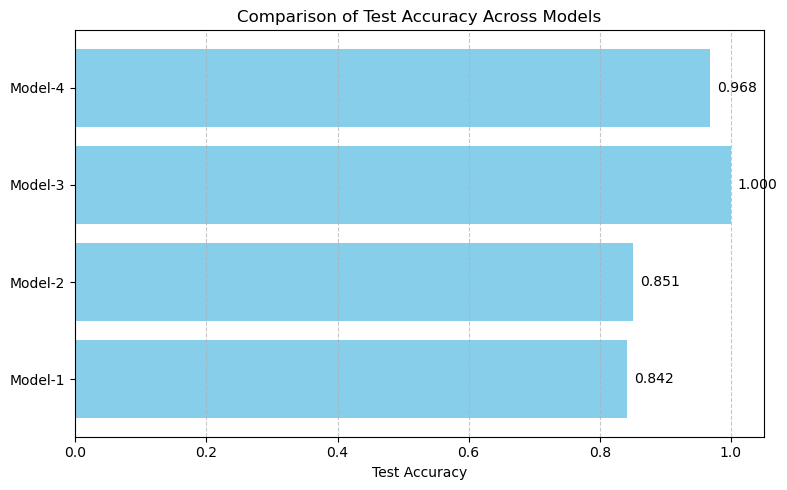

In [117]:
compare_models_metric(results)

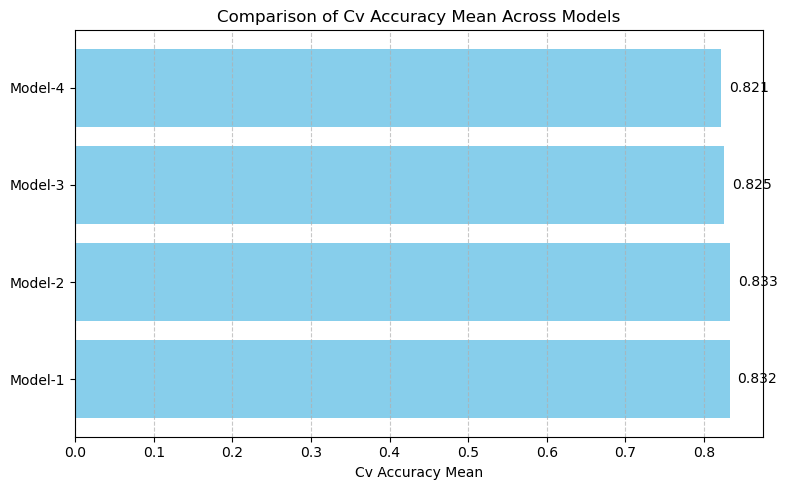

In [118]:
compare_models_metric(results, metric="cv_accuracy_mean")

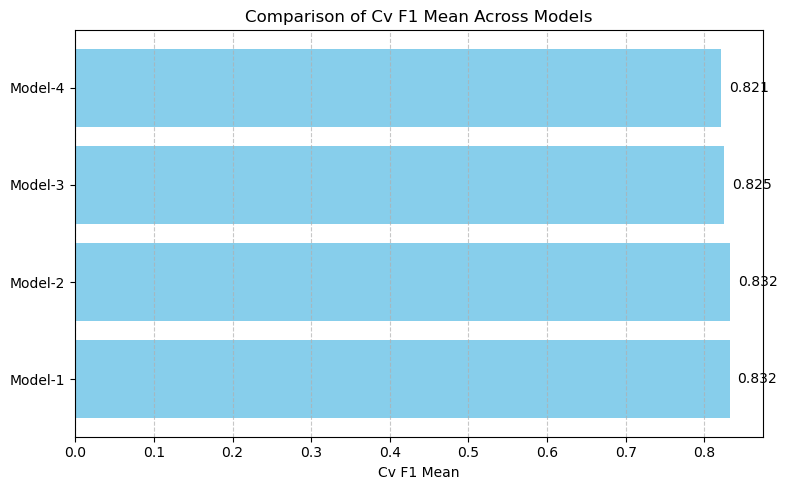

In [119]:
compare_models_metric(results, metric="cv_f1_mean")

In [120]:
results["Model-1"]["confusion_matrix"]

array([[859,  98,   0,   0,   0],
       [ 98, 880, 128,   0,   0],
       [  7, 108, 919,  87,   0],
       [  0,   5,  38, 468,  50],
       [  0,   0,   0,  32, 349]])

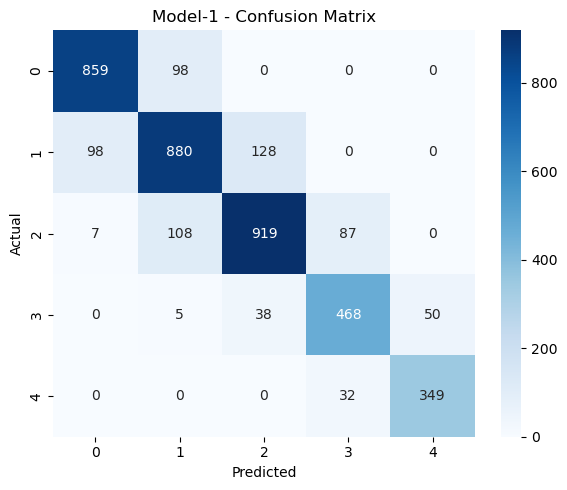

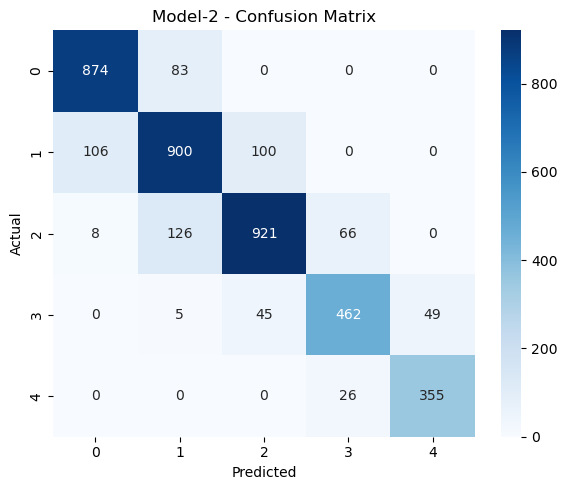

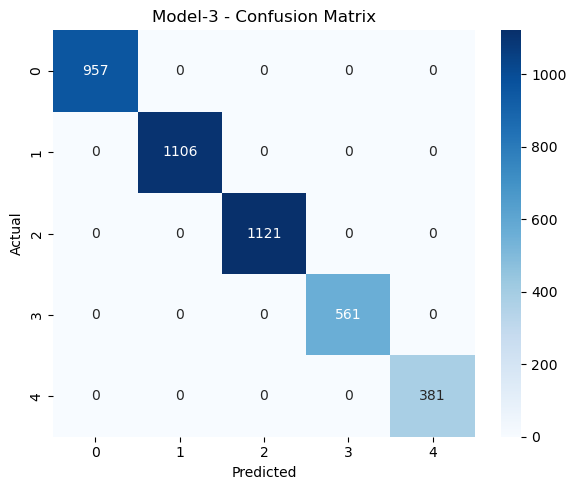

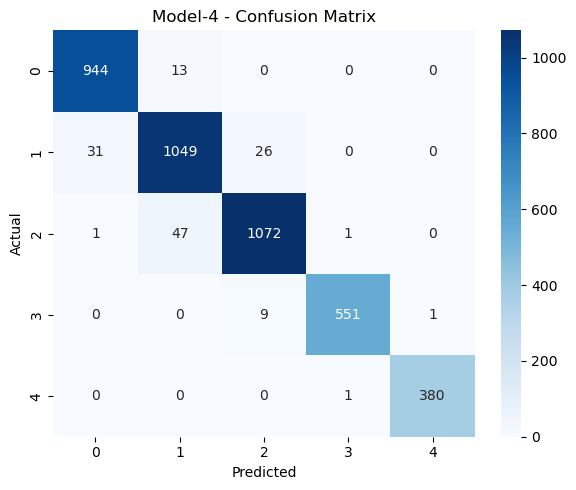

In [121]:
for model_name in results.keys():
    plot_confusion(conf_matrix=results[model_name]["confusion_matrix"], model_name=model_name)

Looks like all the models are performing 'well'. However, they all struggle with classes 3 and 4. This is likely from the class-imbalance seen before.\
We can use an algorithm like SMOTE to increase the number of samples in classes: 3 and 4.

# Class imbalance
1. Apply SMOTE on train-set
2. Try using class weights (alternative to SMOTE)
3. Track performance with and without balancing

## SMOTE on train-set

In [128]:
max(train_df_clean["Stage"].value_counts())

5514

In [129]:
X_raw = train_df_clean[sensor_names].values
y_raw = train_df_clean["Stage"].values

# Apply SMOTE
from imblearn.over_sampling import SMOTE
smote = SMOTE(sampling_strategy={0: 5514,
                                 1: 5514,
                                 2: 5514,
                                 3: 5514,
                                 4: 5514}, random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_raw, y_raw)
print(X_resampled.shape, y_resampled.shape)

(27570, 12) (27570,)


In [130]:
# Checking the number of outliers
train_df_clean_smote = pd.DataFrame(X_resampled, columns=sensor_names)
train_df_clean_smote["Stage"] = y_resampled
get_outlier_counts(train_df_clean_smote, False), len(train_df_clean_smote)

(np.int64(1997), 27570)

In [131]:
# Number (%) of outliers before SMOTE
print(f"{(get_outlier_counts(train_df_clean, False) / len(train_df_clean) * 100):.2f}%")

11.42%


In [132]:
# So the effective number of outliers now are
print(f"{(get_outlier_counts(train_df_clean_smote, False) / len(train_df_clean_smote) * 100):.2f}%")

7.24%


Lets try to fit the models on this new train-set\
We expect the number of outliers to remain the same as SMOTE will only increase points 'close' to eachother.\
Now the train-dataset size has been increased, lets check if the class-imbalance has reduced.

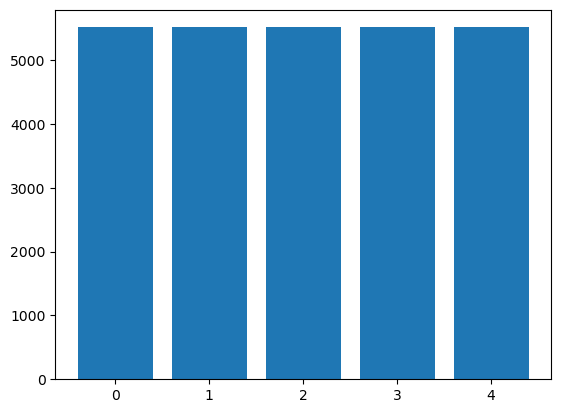

In [133]:
# Check for class imbalance
plt.bar(train_df_clean_smote["Stage"].value_counts().keys(), height=train_df_clean_smote["Stage"].value_counts().values)
plt.show();

## Train models with SMOTE

In [155]:
# Modify classifiers for balanced data and reduce overfitting
models["Model-1"] = LogisticRegression(max_iter=500, random_state=42)
models["Model-2"] = SVC(probability=True, random_state=42)
models["Model-3"] = RandomForestClassifier(max_depth=10,
                                           max_features="sqrt",
                                           min_samples_split=5,
                                           min_samples_leaf=2,
                                           n_jobs=1,
                                           random_state=42)

In [156]:
models

{'Model-1': LogisticRegression(max_iter=500, random_state=42),
 'Model-2': SVC(probability=True, random_state=42),
 'Model-3': RandomForestClassifier(max_depth=10, min_samples_leaf=2, min_samples_split=5,
                        n_jobs=1, random_state=42),
 'Model-4': XGBClassifier(base_score=None, booster=None, callbacks=None,
               colsample_bylevel=None, colsample_bynode=None,
               colsample_bytree=None, device=None, early_stopping_rounds=None,
               enable_categorical=False, eval_metric='mlogloss',
               feature_types=None, feature_weights=None, gamma=None,
               grow_policy=None, importance_type=None,
               interaction_constraints=None, learning_rate=None, max_bin=None,
               max_cat_threshold=None, max_cat_to_onehot=None,
               max_delta_step=None, max_depth=None, max_leaves=None,
               min_child_weight=None, missing=nan, monotone_constraints=None,
               multi_strategy=None, n_estimators=10

In [157]:
X_train, y_train = train_df_clean_smote[sensor_names].to_numpy(), train_df_clean_smote["Stage"].to_numpy()
models_fitted_smote, results_smote = train(models, X_train, y_train, X_test, y_test)

Evaluating Model-1
Evaluating Model-2
Evaluating Model-3
Evaluating Model-4


## Compare models

In [158]:
# Get model metrics' names
results_smote["Model-1"].keys()

dict_keys(['test_accuracy', 'test_f1', 'test_precision', 'test_recall', 'test_balanced_accuracy', 'test_kappa', 'test_mcc', 'confusion_matrix', 'classification_report', 'cv_accuracy_mean', 'cv_f1_mean', 'cv_accuracy_std', 'cv_f1_std'])

### Generic comparisions

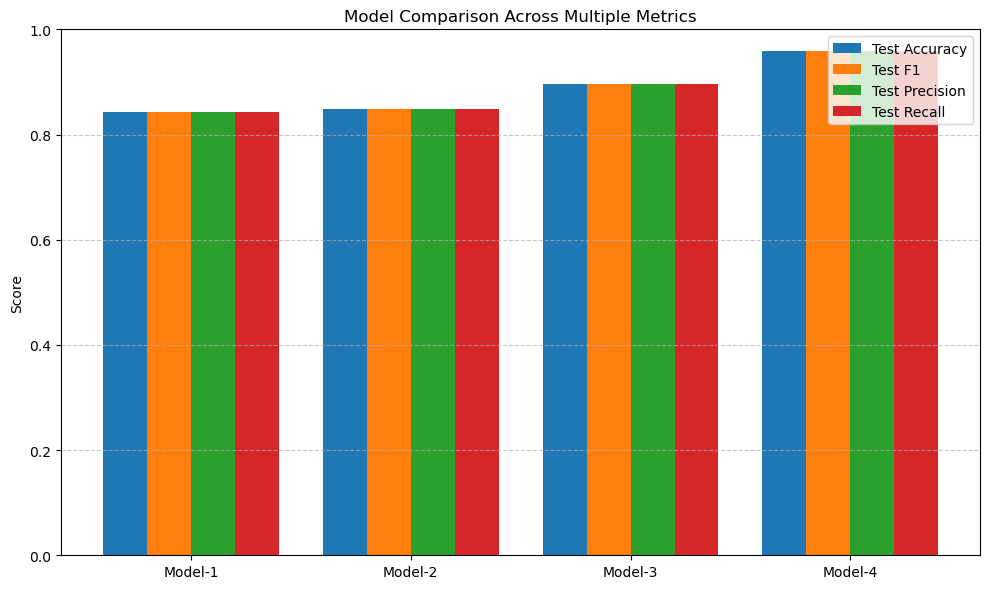

In [159]:
compare_models_multiple_metrics(
    results_smote,
    metrics = ["test_accuracy",
               "test_f1",
               "test_precision",
               "test_recall"]
)

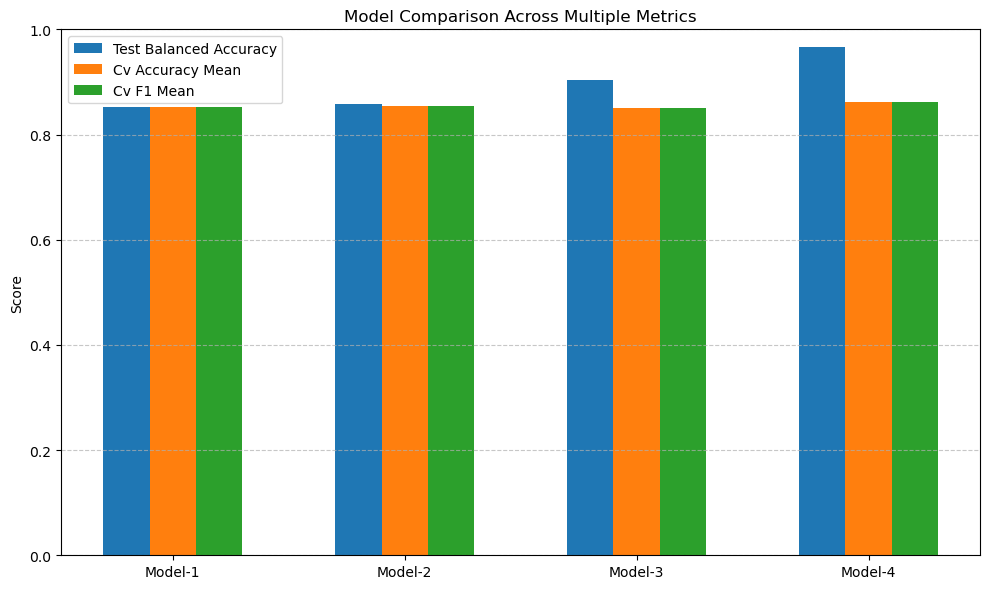

In [160]:
compare_models_multiple_metrics(
    results_smote,
    metrics = ["test_balanced_accuracy",
               "cv_accuracy_mean",
               "cv_f1_mean",]
)

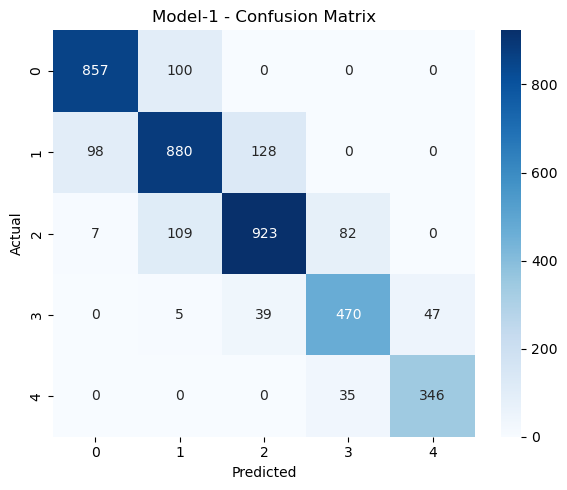

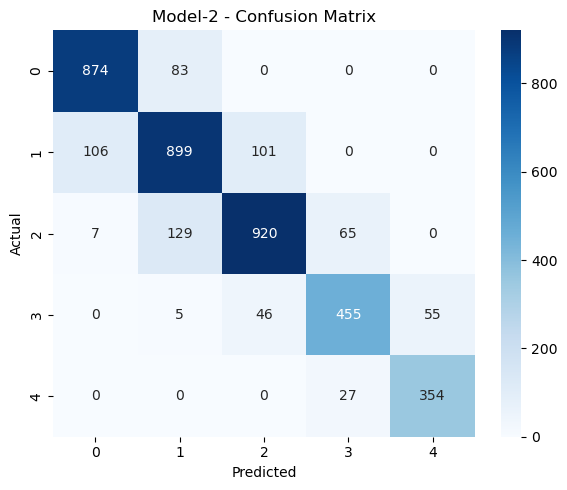

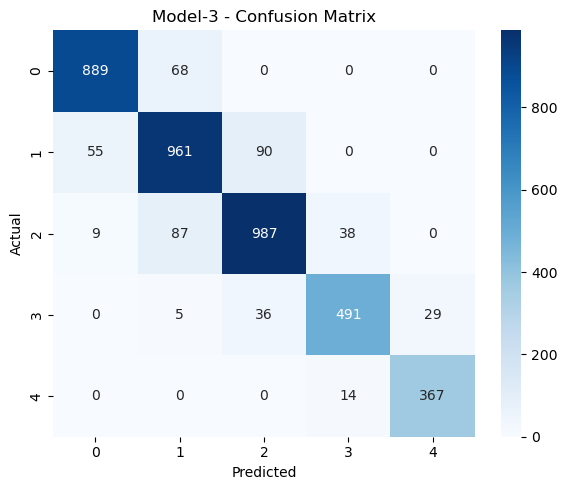

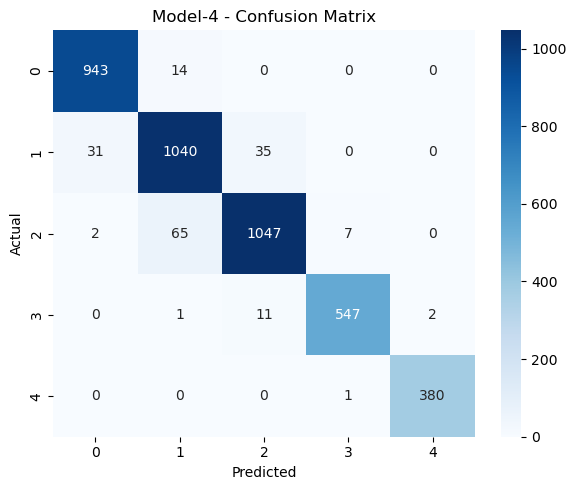

In [161]:
for model_name in results.keys():
    plot_confusion(conf_matrix=results_smote[model_name]["confusion_matrix"], model_name=model_name)

### Conf-mat before and after SMOTE

In [162]:
# Comparing model-by-model before and after SMOTE
# Model-1
def model_conf_mat_before_after_smote(model_name):
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    sns.heatmap(results[model_name]["confusion_matrix"], ax=axes[0], cmap="Blues", annot=True, fmt="d", cbar=False)
    axes[0].set_title(f'{model_name} - Before SMOTE')
    sns.heatmap(results_smote[model_name]["confusion_matrix"], ax=axes[1], cmap="Blues", annot=True, fmt="d", cbar=False)
    axes[1].set_title(f'{model_name} - After SMOTE')
    plt.tight_layout()
    plt.show()


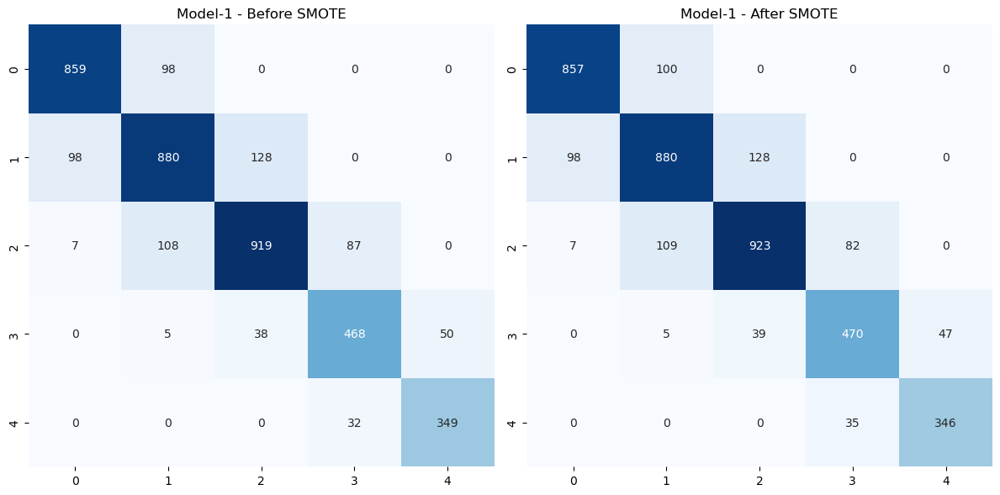

In [163]:
model_conf_mat_before_after_smote("Model-1")

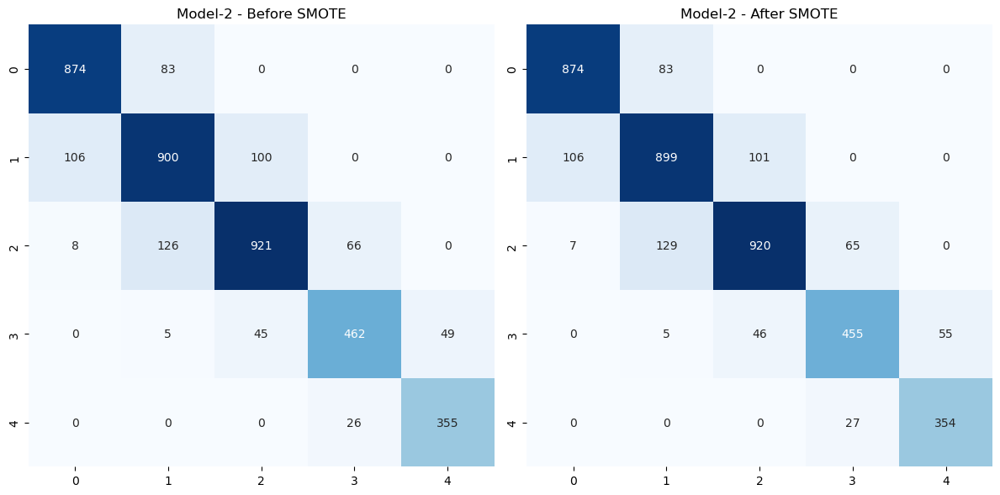

In [164]:
model_conf_mat_before_after_smote("Model-2")

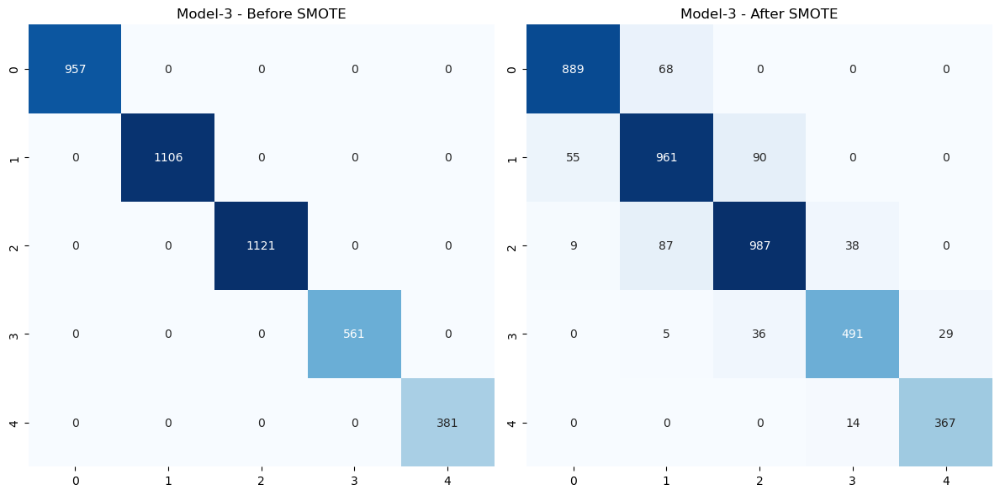

In [165]:
model_conf_mat_before_after_smote("Model-3")

This is good, the model was overfitting eariler...\
The new model is well-generalized.

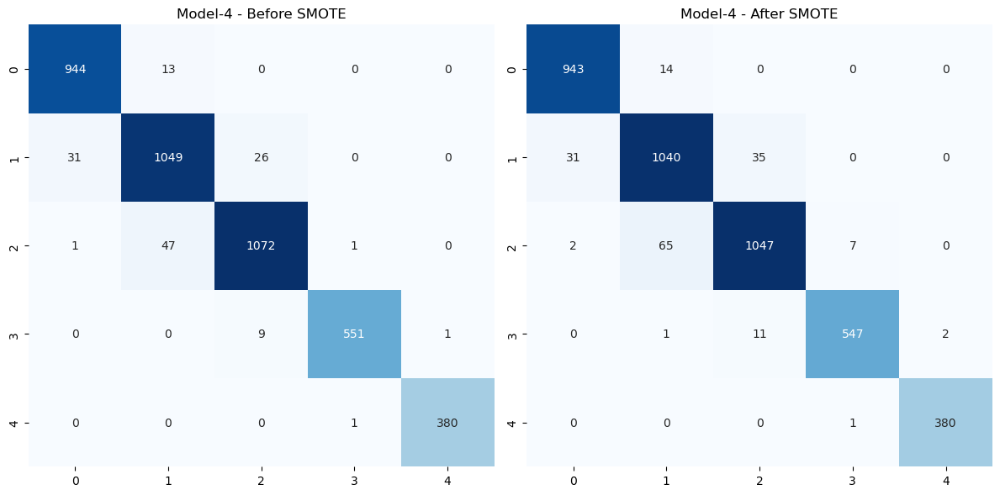

In [166]:
model_conf_mat_before_after_smote("Model-4")

### Classification report analysis

In [169]:
for model_name in results_smote.keys():
    print(f"Model: {model_name}")
    print(results_smote[model_name]["classification_report"])
    print("---"*5)

Model: Model-1
              precision    recall  f1-score   support

           0      0.891     0.896     0.893       957
           1      0.804     0.796     0.800      1106
           2      0.847     0.823     0.835      1121
           3      0.801     0.838     0.819       561
           4      0.880     0.908     0.894       381

    accuracy                          0.842      4126
   macro avg      0.845     0.852     0.848      4126
weighted avg      0.842     0.842     0.842      4126

---------------
Model: Model-2
              precision    recall  f1-score   support

           0      0.886     0.913     0.899       957
           1      0.806     0.813     0.809      1106
           2      0.862     0.821     0.841      1121
           3      0.832     0.811     0.821       561
           4      0.866     0.929     0.896       381

    accuracy                          0.849      4126
   macro avg      0.850     0.857     0.853      4126
weighted avg      0.849     0.8

**Model selection**

After analyzing the classification reports and comparing the models' performance, we are left with two candidates: Model 3 and Model 4.

To make a final decision, let's focus on their performance in Stages 3 and 4:

### ROC-AUC plot analysis

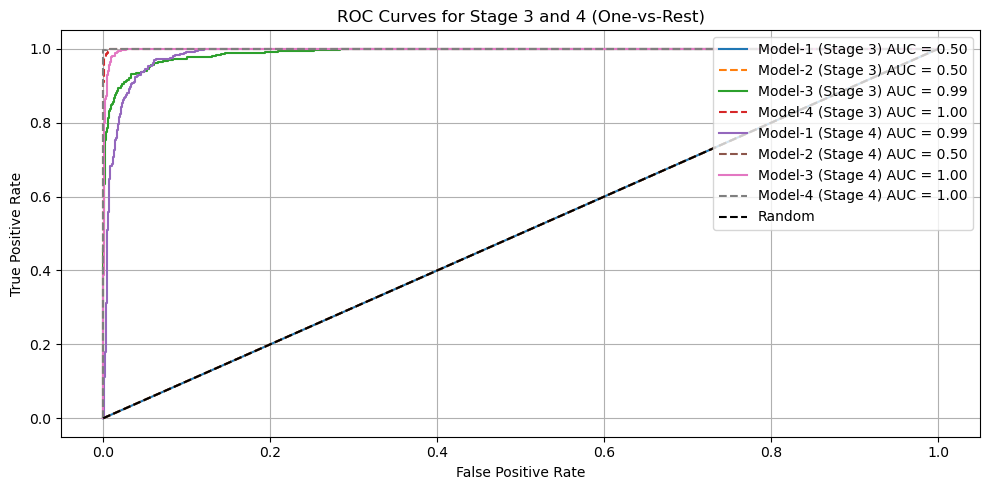

In [173]:
# Compare the models using a ROC-AUC plot(s)
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc

y_test_bin = label_binarize(y_test, classes=[0, 1, 2, 3, 4])  # Binarize the output for one-vs-rest

# Get probabilities (or decision scores) from each model
proba_1 = models_fitted_smote["Model-1"].predict_proba(X_test)
proba_2 = models_fitted_smote["Model-2"].predict_proba(X_test)
proba_3 = models_fitted_smote["Model-3"].predict_proba(X_test)
proba_4 = models_fitted_smote["Model-4"].predict_proba(X_test)

stages_to_check = [3, 4]

plt.figure(figsize=(10, 5))
for stage in stages_to_check:
    fpr1, tpr1, _ = roc_curve(y_test_bin[:, stage], proba_1[:, stage])
    fpr2, tpr2, _ = roc_curve(y_test_bin[:, stage], proba_2[:, stage])
    fpr3, tpr3, _ = roc_curve(y_test_bin[:, stage], proba_3[:, stage])
    fpr4, tpr4, _ = roc_curve(y_test_bin[:, stage], proba_4[:, stage])
    roc_auc1 = auc(fpr1, tpr1)
    roc_auc2 = auc(fpr2, tpr2)
    roc_auc3 = auc(fpr3, tpr3)
    roc_auc4 = auc(fpr4, tpr4)

    plt.plot(fpr1, tpr1, label=f'Model-1 (Stage {stage}) AUC = {roc_auc1:.2f}')
    plt.plot(fpr2, tpr2, label=f'Model-2 (Stage {stage}) AUC = {roc_auc2:.2f}', linestyle='--')
    plt.plot(fpr3, tpr3, label=f'Model-3 (Stage {stage}) AUC = {roc_auc3:.2f}')
    plt.plot(fpr4, tpr4, label=f'Model-4 (Stage {stage}) AUC = {roc_auc4:.2f}', linestyle='--')

plt.plot([0, 1], [0, 1], 'k--', label="Random")
plt.title("ROC Curves for Stage 3 and 4 (One-vs-Rest)")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc="upper right")
plt.grid(True)
plt.tight_layout()
plt.show()

This tells a completely different story.

When classifying (between stages 3 and 4) Model-1 is is no better than randomly guessing. Whereas, Model-4 makes very-well informed predictions.

Even if Model-1 had slighly better macro metrics before, Model-4 is clearly the better choice for critical degradation stage prediction.

**Final verdict**:\
We shall proceed with **Model-4 (XGBoost)** as it provides a good balance in performance (overall). And especially good performance in predicting stages 3 and 4.

## Model-class definition (for save and load)

In [174]:
import pickle
from pathlib import Path
from sklearn.pipeline import Pipeline

class Phase2Pipeline():
    def __init__(self, model):
        """
        Args:
            model: fitted model, XGBoost model trained on SMOTE (enhanced) data.
        """
        self.model = model

    def predict(self, X):
        return self.model.predict(X)
        
    def predict_proba(self, X):
        return self.model.predict_proba(X)

    def save(self, path):
        path = Path(path)
        with open(path, "wb") as f:
            pickle.dump(self, f)
        print(f"[INFO] Model saved to:\n{path.resolve()}")

    @classmethod
    def load(cls, path):
        path = Path(path)
        with open(path, "rb") as f:
            print(f"[INFO] Loading model from:\n{path.resolve()}")
            return pickle.load(f)

save_path = Path("./stage_classifier_pipeline.pkl")

classifier = Phase2Pipeline(models_fitted_smote["Model-4"])
classifier.save(save_path)

[INFO] Model saved to:
/Users/dhruvnandigam/Desktop/Dhruv/University/Sem 4/ML/ML_Project/G_007_053_055_132_199/code/Phase_2/stage_classifier_pipeline.pkl


In [175]:
loaded_classifier = Phase2Pipeline.load(save_path)

[INFO] Loading model from:
/Users/dhruvnandigam/Desktop/Dhruv/University/Sem 4/ML/ML_Project/G_007_053_055_132_199/code/Phase_2/stage_classifier_pipeline.pkl


# Feature importance and explainability

1. Use `feature_importances_` from random forest (or) XGBoost
2. Try SHAP or PermutationImportance
3. Drop irrelevant features and retrain

Since we are using Model-4 (XGBoost), we can just use `feature_importances_` for the sake of feature importance and model-explainability.

## XGBoost native feat-importance

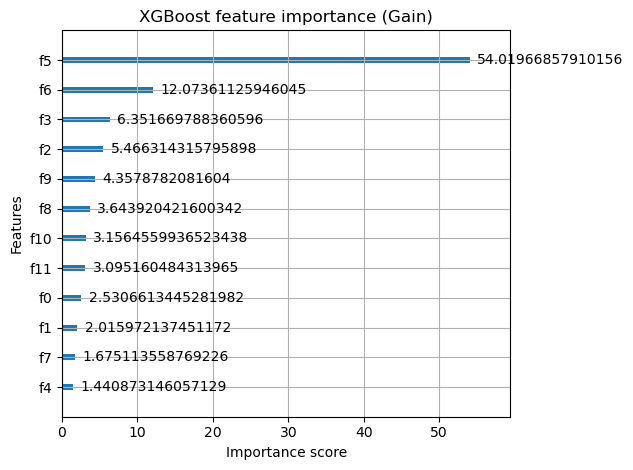

In [176]:
import xgboost as xgb
xgb.plot_importance(classifier.model, importance_type="gain", max_num_features=15)
plt.title("XGBoost feature importance (Gain)")
plt.tight_layout()
plt.show();

## SHAP

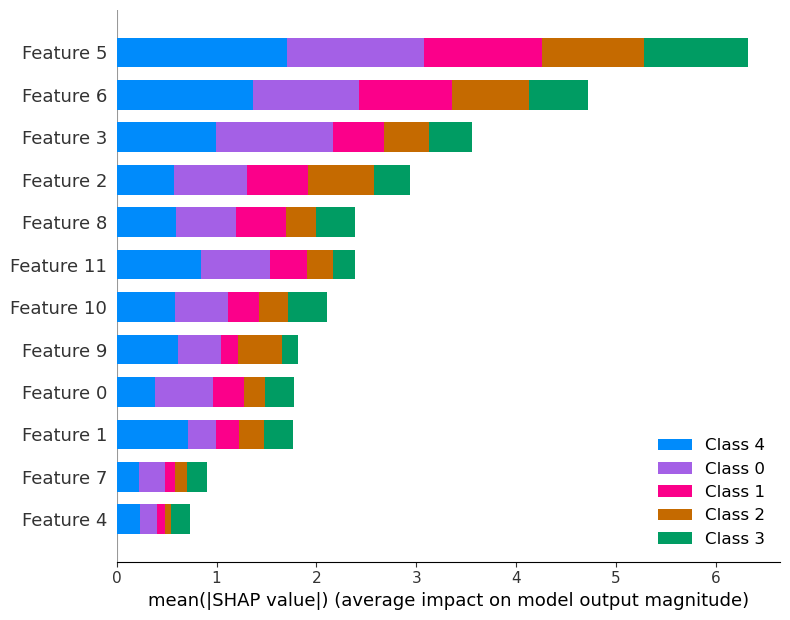

In [177]:
import shap

explainer = shap.Explainer(classifier.model)
random_sample_ids = np.random.choice(X_train.shape[0], size=500, replace=False)  # 500 samples
X_sample = X_train[random_sample_ids]
shap_values = explainer(X_sample)

shap.summary_plot(shap_values, X_sample)

From the above analysis, we can conclude that:
- Feature 5 is the most informative overall, followed by Features 6 and 2.
- Since we are focusing on classification performance for stages 3 and 4, we can conclude that:
    - Feature 5, 6, 2, 3 have high contributions for Class 4 (blue) and Class 3 (orange/gold)
    - These are the features driving correct classification for the tatget stages

Simply put, features 5, 6, 2, and 3 are the most influential in stage classification, especially for the classification of engines (likely) in Stages 3 and 4.